# Image Anomaly Detection with Convolutional Autoencoder

### Abstract
This project develops a system for **Unsupervised Anomaly Detection for images** using **Convolutional Autoencoder**. The model learns to reconstruct normal samples and detects anomalies by **computing reconstruction errors** and evaluating them with a **threshold**. I'm using **MVTec AD - Bottle** dataset and, by combining **pixel-wise, perceptual and patch-level error metrics** for an ensemble scoring strategy, the system effectively distinguishes between normal and anomalous items.

---

### Problem -> Solution
- **Problem:** in many industriual companies, a critical quality assurance task is **detecting defects in manufactured products**. Manual inspection takes time, is costly and subject to human error. There's the need for an **automized and computer-vision model** to effectively detect anomalies and **generalize** when defects vary in type or size.

- **Solution:** I built this system based on a Convolutional Autoencoder to be trained on normal samples to learn their structure, reconstruct normal samples and detect anomalies on test samples by evaluating how much anomalous reconstructions diverge from normal ones. To detect this, I use an ensemble scoring strategy combining:
    - **MSE** (pixel-wise errors)
    - **SSIM** (structural similarity)
    - **Patch-level error**

with thresholds based on: **Youden J** and **Recall-driven** criteria.

---

### **Results**
The system achieves strong performance with **ROC-AUC=0.80, F1-score=0.87**.

---

### Why it's relevant
An **Image Anomaly Detection System** can be applied in a wide range of industries, such as:
- **Manufacturing and Industry 4.0**: automatically detect defective products
- **Healthcare imaging**: identify anomalies in X-ray or MRIs
- **Cybersecurity**: fraud detection in images or videos

An automated approach powered by AI brings a number of advantages:
- Automate quality control, improving efficiency and reducing costs
- Adaptability in many industries
- Less need for large anomaly datasets


## Step 1 - Dataset setup and Visualization

In [37]:
# Necessary imports

import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory
import matplotlib.pyplot as plt

In [174]:
# Setup

import os, random, numpy as np, tensorflow as tf
SEED = 42
random.seed(SEED); np.random.seed(SEED); tf.random.set_seed(SEED)

Found 209 files.
Found 83 files belonging to 4 classes.
Train batch shape: (32, 256, 256, 3)
Test batch shape: (32, 256, 256, 3)
Labels shape: (32,)
Labels: [0 3 2 1 0 3 0 2 2 2 3 2 3 0 2 2 1 1 0 1 0 1 2 3 1 3 0 3 3 2 3 1]
Min pixel value: 0.098039225
Max pixel value: 1.0


Text(0.5, 0.98, 'Some Train Samples')

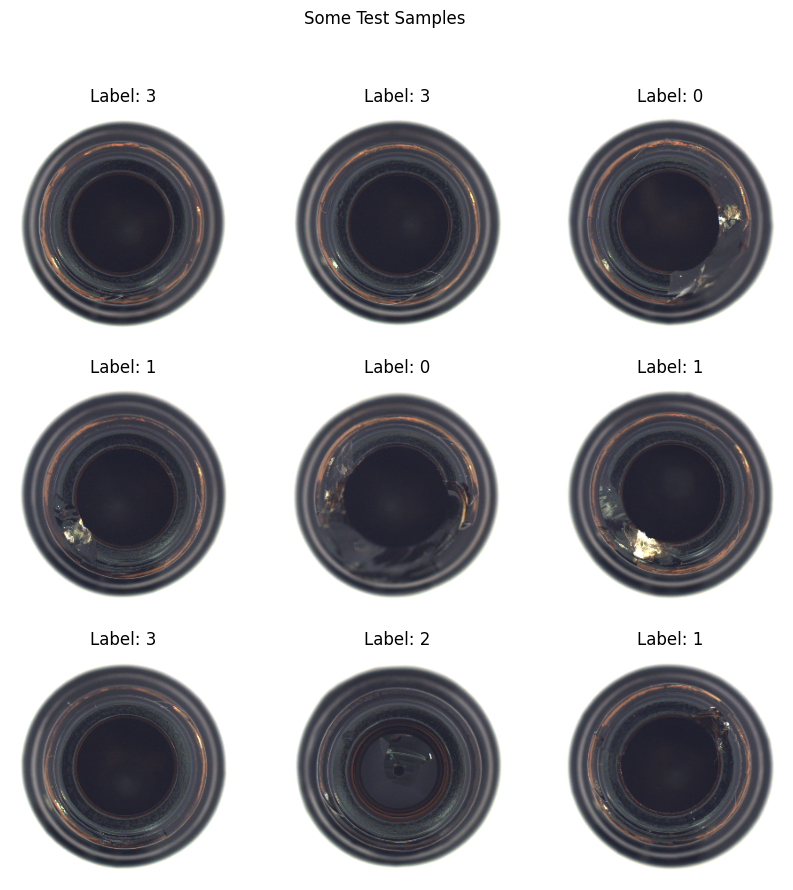

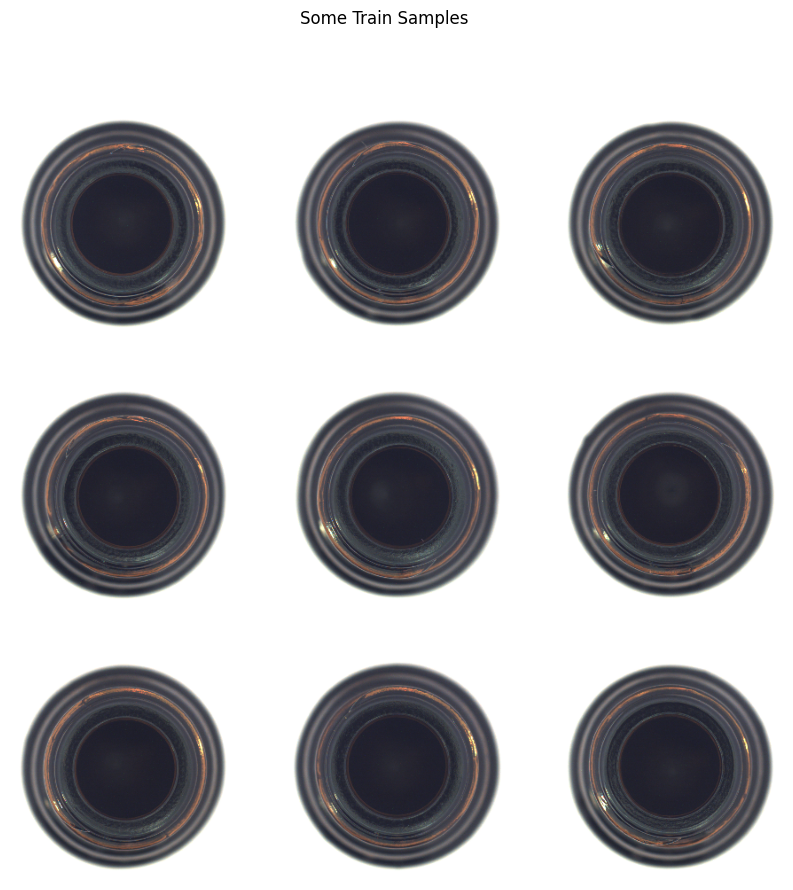

In [85]:
# Preprocessing

IMG_SIZE = (256,256)
BATCH_SIZE = 32

# Train Dataset - only normal
train_ds = image_dataset_from_directory(
    "dataset/bottle/train",
    labels=None,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

# Test dataset - normal and anomaly
test_ds = image_dataset_from_directory(
    "dataset/bottle/test",
    label_mode="int",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

# Normalization 0-1
normalization_layer = tf.keras.layers.Rescaling(1./255)

train_ds = train_ds.map(lambda x: normalization_layer(x))
test_ds = test_ds.map(lambda x, y: (normalization_layer(x), y))

# Batch shapes
for images in train_ds.take(1):
    print(f"Train batch shape: {images.shape}")

for images, labels in test_ds.take(1):
    print(f"Test batch shape: {images.shape}")
    print(f"Labels shape: {labels.shape}")
    print(f"Labels: {labels.numpy()}")

# Pixel values range, confirm 0-1 normalization worked
for images in train_ds.take(1):
    print("Min pixel value:", tf.reduce_min(images).numpy())
    print("Max pixel value:", tf.reduce_max(images).numpy())

# Let's visualize a few samples
# Test samples
for images, labels in test_ds.take(1):
    plt.figure(figsize=(10,10))
    for i in range(9):
        ax = plt.subplot(3,3,i+1)
        plt.imshow(images[i].numpy())
        plt.title(f"Label: {labels[i].numpy()}")
        plt.axis("off")
    break
plt.suptitle("Some Test Samples")

# Train samples
for images in train_ds.take(1):
    plt.figure(figsize=(10,10))
    for i in range(9):
        ax = plt.subplot(3,3,i+1)
        plt.imshow(images[i].numpy())
        plt.axis("off")
    break
plt.suptitle("Some Train Samples")

Train batches: 6
Validation batches: 1
Train batch shape: (32, 256, 256, 3)
Train pixel range: 0.10217525064945221 to 1.0
Validation batch shape: (32, 256, 256, 3)
Validation pixel range: 0.09803922474384308 to 1.0


2025-09-19 09:04:03.035109: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Text(0.5, 0.98, 'Some Validation Samples')

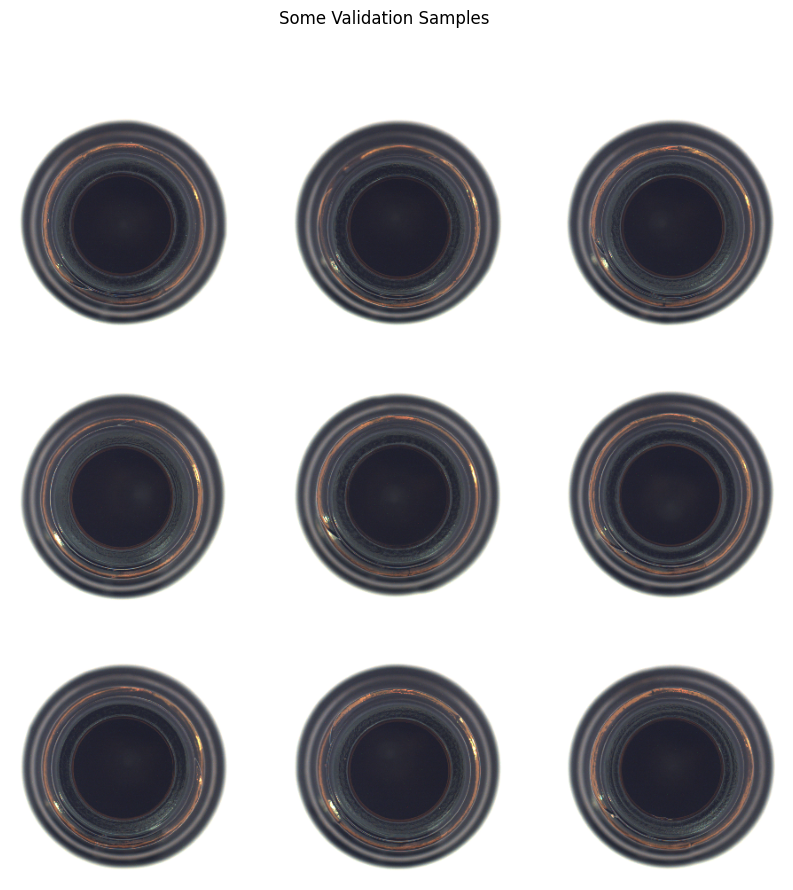

In [86]:
# Divide train in train + validation

val_prop = 0.2

num_batches = tf.data.experimental.cardinality(train_ds).numpy()
val_batches = int(num_batches * val_prop)

val_ds = train_ds.take(val_batches)
train_ds = train_ds.skip(val_batches)

# Let's check how many batches are in each split
print(f"Train batches: {tf.data.experimental.cardinality(train_ds).numpy()}")
print(f"Validation batches: {tf.data.experimental.cardinality(val_ds).numpy()}")

# Inspect a sample batch
for images in train_ds.take(1):
    print(f"Train batch shape: {images.shape}")
    print(f"Train pixel range: {tf.reduce_min(images).numpy()} to {tf.reduce_max(images).numpy()}")

for images in val_ds.take(1):
    print(f"Validation batch shape: {images.shape}")
    print(f"Validation pixel range: {tf.reduce_min(images).numpy()} to {tf.reduce_max(images).numpy()}")

# Example visualization just for help
for images in val_ds.take(1):
    plt.figure(figsize=(10,10))
    for i in range(9):
        ax = plt.subplot(3,3,i+1)
        plt.imshow(images[i].numpy())
        plt.axis("off")
    break
plt.suptitle("Some Validation Samples")

In [87]:
# Initial statistics

def dataset_stats(path):
    count = 0
    for root, _, files in os.walk(path):
        for f in files:
            if f.endswith((".png", ".jpg", ".jpeg")):
                count += 1
    
    return count

print(f"Train normal: {dataset_stats("dataset/bottle/train/good")}")
print(f"Test normal: {dataset_stats("dataset/bottle/test/good")}")
print(f"Test anomalies: {dataset_stats("dataset/bottle/test") - dataset_stats("dataset/bottle/test/good")}")

Train normal: 209
Test normal: 20
Test anomalies: 63


## Step 2 - Convolutional Autoencoder

In [88]:
# Necessary imports

import os, random, numpy as np, tensorflow as tf, matplotlib.pyplot as plt
from tensorflow.keras import layers


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.10416932..1.0243714].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.10285022..1.0237817].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.10599651..1.0325912].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.10418933..1.0224674].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.11066042..1.025182].


IMG_SHAPE = (256, 256, 3)
Batch shape: (32, 256, 256, 3)
Pixel range: 0.09196146577596664 -> 1.0325912237167358


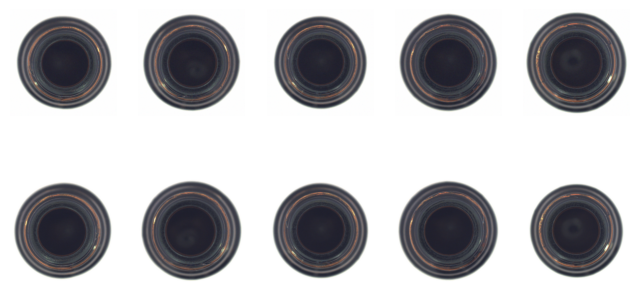

In [127]:
# Setup and utility

SEED = 42
random.seed(SEED); np.random.seed(SEED); tf.random.set_seed(SEED)

# Performance and pipeline
AUTOTUNE = tf.data.AUTOTUNE

# augment a bit for more generalization
augment = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.02),
    layers.RandomZoom(0.05),
], name="ae_aug")

# Denoising: Gaussian noise only on input
noise = tf.keras.Sequential([layers.GaussianNoise(0.01)], name="ae_noise")

# train_ds and val_ds only images without label, normalized in [0,1]
# Autoencoder: target = input (x->x)
ae_train = train_ds.map(lambda x: (augment(noise(x, training=True), training=True), augment(x, training=True))).cache().shuffle(512, seed=42).prefetch(AUTOTUNE)

ae_val   = val_ds.map(lambda x: (x, x)).cache().prefetch(AUTOTUNE)


# Dynamically get shape
for batch in ae_train.take(1):
    example = batch[0]
IMG_SHAPE = example.shape[1:]
print(f"IMG_SHAPE = {IMG_SHAPE}")

# Confirm 
print(f"Batch shape: {example.shape}")
print(f"Pixel range: {example.numpy().min()} -> {example.numpy().max()}")

sample_x, sample_y = next(iter(ae_train))
plt.figure(figsize=(8,4))
for i in range(5):
    ax = plt.subplot(2,5,i+1)
    plt.imshow(sample_x[i])
    plt.axis("off")
    ax = plt.subplot(2,5,i+6)
    plt.imshow(sample_y[i])
    plt.axis("off")
plt.show()


Model: "conv_autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 128, 128, 32)   │           864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_30          │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_30 (Activation)      │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 64, 64, 64)     │        18,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_31          │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_31 (Activation)      │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_24 (Conv2D)              │ (None, 32, 32, 128)    │        73,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_32          │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_32 (Activation)      │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_25 (Conv2D)              │ (None, 16, 16, 32)     │        36,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_20             │ (None, 32, 32, 128)    │        36,864 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_33          │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_33 (Activation)      │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_21             │ (None, 64, 64, 64)     │        73,728 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_34          │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_34 (Activation)      │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_26 (Conv2D)              │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_22             │ (None, 128, 128, 32)   │        18,432 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_35          │ (None, 128, 128, 32)   │           12

 Total params: 298,531 (1.14 MB)

 Trainable params: 297,635 (1.14 MB)

 Non-trainable params: 896 (3.50 KB)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.10435847..1.0243714].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.09909888..1.0237817].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.101541966..1.0325912].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.10002308..1.0224674].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.10672332..1.025182].


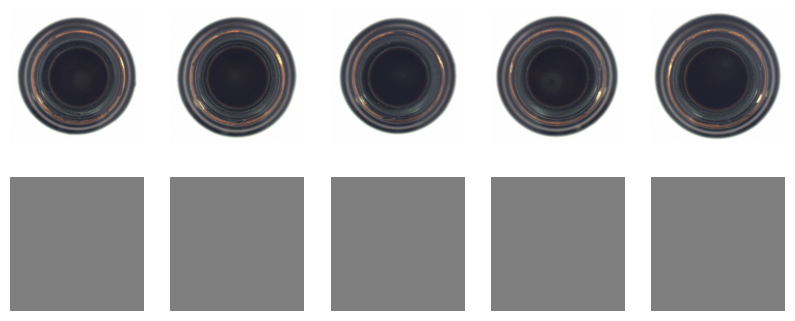

In [107]:
# Architecture for the Autoencoder: ENCODER -> BOTTLENECK -> DECODER

from tensorflow.keras import layers, models, regularizers

def build_autoencoder(img_shape):
    inputs = layers.Input(shape=img_shape)

    # ENCODER
    x = layers.Conv2D(32, 3, strides=2, padding="same", use_bias=False)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.Conv2D(64, 3, strides=2, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.Conv2D(128, 3, strides=2, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    # BOTTLENECK
    x = layers.Conv2D(
        32, 3, strides=2, padding="same", activation="relu", 
        kernel_regularizer=regularizers.l2(1e-5)
    )(x)
    x = layers.Dropout(0.15)(x) # a bit more dropout for generalization

    # DECODER
    x = layers.Conv2DTranspose(128, 3, strides=2, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.Conv2DTranspose(64, 3, strides=2, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.Conv2D(64, 3, strides=1, padding="same", activation="relu")(x)

    x = layers.Conv2DTranspose(32, 3, strides=2, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    outputs = layers.Conv2DTranspose(3, 3, strides=2, padding="same", activation="sigmoid")(x)
    # chose sigmoid to stay in [0,1] like normalized input

    model = models.Model(inputs, outputs, name="conv_autoencoder")
    return model

autoencoder = build_autoencoder(IMG_SHAPE)
autoencoder.summary()

# Forward pass on batch
sample_x, _ = next(iter(ae_train))
recon_x = autoencoder.predict(sample_x[:5])
plt.figure(figsize=(10,4))
for i in range(5):
    # Input
    ax = plt.subplot(2,5,i+1)
    plt.imshow(sample_x[i])
    plt.axis("off")
    # Output ricostruito
    ax = plt.subplot(2,5,i+6)
    plt.imshow(recon_x[i])
    plt.axis("off")
plt.show()


In [109]:
# Compilation, MSE and callback

from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
import tensorflow as tf

def recon_loss(y_true, y_pred, alpha=0.4, beta=0.2, gamma=0.4):
    mae = tf.reduce_mean(tf.abs(y_true - y_pred))
    mse = tf.reduce_mean(tf.square(y_true - y_pred))
    ssim = tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))
    return alpha*mae + beta*mse + gamma*(1.0 - ssim)

def ssim_metric(y_true, y_pred):
    return tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))

# Compile
autoencoder.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss=recon_loss,
    metrics=[tf.keras.metrics.MeanSquaredError(name="mse"), ssim_metric]
)

# Directory for model saving
os.makedirs("models", exist_ok=True)

callbacks = [
    EarlyStopping(monitor="val_loss", patience=8, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=4, min_lr=1e-6, verbose=1),
    ModelCheckpoint("models/autoencoder_best.keras", monitor="val_loss", save_best_only=True, verbose=1)
]

In [110]:
# Training + save

EPOCHS = 60 # might end earlier with EarlyStopping

history = autoencoder.fit(
    ae_train,
    validation_data=ae_val,
    epochs=EPOCHS,
    callbacks=callbacks,
    verbose=1
)

# Save also last state
autoencoder.save("models/autoencoder_last.keras")

Epoch 1/60
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - loss: 0.4956 - mse: 0.1290 - ssim_metric: 0.1536
Epoch 1: val_loss improved from None to 0.38700, saving model to models/autoencoder_best.keras
6/6 ━━━━━━━━━━━━━━━━━━━━ 30s 5s/step - loss: 0.4625 - mse: 0.1212 - ssim_metric: 0.2191 - val_loss: 0.3870 - val_mse: 0.1291 - val_ssim_metric: 0.4281 - learning_rate: 0.0010
Epoch 2/60
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - loss: 0.4085 - mse: 0.1022 - ssim_metric: 0.3170
Epoch 2: val_loss did not improve from 0.38700
6/6 ━━━━━━━━━━━━━━━━━━━━ 26s 4s/step - loss: 0.4024 - mse: 0.0995 - ssim_metric: 0.3265 - val_loss: 0.4082 - val_mse: 0.1124 - val_ssim_metric: 0.3488 - learning_rate: 0.0010
Epoch 3/60
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - loss: 0.3842 - mse: 0.0917 - ssim_metric: 0.3568
Epoch 3: val_loss did not improve from 0.38700
6/6 ━━━━━━━━━━━━━━━━━━━━ 28s 5s/step - loss: 0.3790 - mse: 0.0900 - ssim_metric: 0.3651 - val_loss: 0.3877 - val_mse: 0.1131 - val_ssim_metric: 0.3983 - learning_rate:

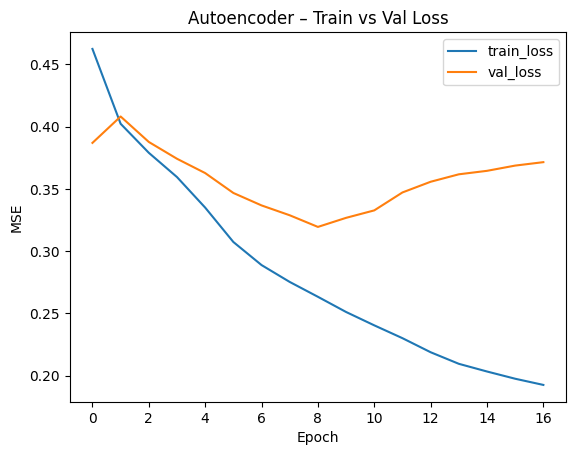

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


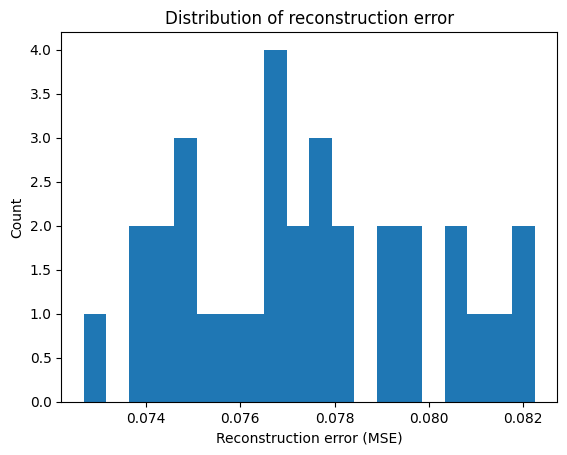

In [111]:
# Plot loss (train/val)

train_loss = history.history["loss"]
val_loss = history.history["val_loss"]

plt.figure()
plt.plot(train_loss, label="train_loss")
plt.plot(val_loss, label="val_loss")
plt.xlabel("Epoch")
plt.ylabel("MSE")
plt.title("Autoencoder – Train vs Val Loss")
plt.legend()
plt.show()

# Error distribution after reconstruction
errors = np.mean(np.square(sample_x[:100] - autoencoder.predict(sample_x[:100])), axis=(1,2,3))
plt.hist(errors, bins=20)
plt.xlabel("Reconstruction error (MSE)")
plt.ylabel("Count")
plt.title("Distribution of reconstruction error")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


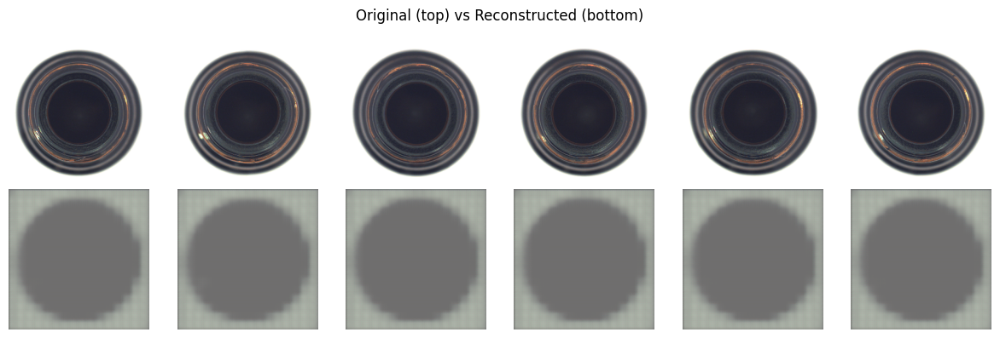

In [112]:
# Quick qualitative verification

import itertools

for (x_batch, _) in ae_val.take(1):
    preds = autoencoder.predict(x_batch, verbose=1)
    break

n = min(6, x_batch.shape[0])
plt.figure(figsize=(12,4))

for i in range(n):
    # originals
    ax = plt.subplot(2, n, i+1); plt.imshow(x_batch[i]); plt.axis("off")
    # reconstructions
    ax = plt.subplot(2, n, i+1+n); plt.imshow(preds[i]); plt.axis("off")
plt.suptitle("Original (top) vs Reconstructed (bottom)")
plt.tight_layout()
plt.show()

## Step 3 - Anomaly Metrics

In [113]:
# Utility function - Reconstruction error for image

def compute_reconstruction_errors(model: tf.keras.Model, dataset) -> tuple[np.ndarray, np.ndarray]:
    all_errors = []
    all_labels = []

    for x_batch, y_batch in dataset:
        x_hat = model.predict(x_batch, verbose=0)
        # MSE for image
        batch_errors = tf.reduce_mean(tf.square(x_batch - x_hat), axis=(1,2,3)).numpy()
        all_errors.append(batch_errors)
        all_labels.append(y_batch.numpy())

    errors = np.concatenate(all_errors, axis=0)
    labels = np.concatenate(all_labels, axis=0).astype(int)

    return errors, labels

In [114]:
from sklearn.metrics import roc_auc_score, roc_curve, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

def threshold_k_sigma(errors_normal, k=3.0):
    return float(np.mean(errors_normal) + k * np.std(errors_normal, ddof=1))

def threshold_median_mad(errors_normal, k=3.5):
    med = np.median(errors_normal)
    mad = np.median(np.abs(errors_normal - med)) + 1e-12
    return float(med + k * 1.4826 * mad)

def threshold_youden(scores, labels):
    fpr, tpr, thr = roc_curve(labels, scores, pos_label=1)
    j = tpr - fpr
    return float(thr[int(np.argmax(j))])

from sklearn.metrics import precision_recall_curve
def threshold_for_target_recall(scores, labels, target_recall=0.80):
    prec, rec, thr = precision_recall_curve(labels, scores)
    idx = np.where(rec[:-1] >= target_recall)[0]
    return float(thr[idx[0]]) if len(idx) else float(thr[-1])

def eval_with_thr(labels, scores, thr):
    y_pred = (scores >= thr).astype(int)
    cm  = confusion_matrix(labels, y_pred)
    acc = accuracy_score(labels, y_pred)
    pre = precision_score(labels, y_pred, zero_division=0)
    rec = recall_score(labels, y_pred, zero_division=0)
    f1  = f1_score(labels, y_pred, zero_division=0)
    return cm, acc, pre, rec, f1

In [115]:
# Helper for Youden threshold

def binarize_anomaly_labels(labels, normal_label=0):
    y = np.asarray(labels).ravel()

    return (y != normal_label).astype(int)

In [ ]:
# Compute MSE, 1-SSIM, Combined Score

"""
def compute_scores_mse_ssim(model, dataset):
    all_mse, all_ssim, all_labels = [], [], []
    for x_batch, y_batch in dataset:
        x_hat = model.predict(x_batch, verbose=0)
        mse  = tf.reduce_mean(tf.square(x_batch - x_hat), axis=(1,2,3)).numpy()
        ssim = tf.image.ssim(x_batch, x_hat, max_val=1.0).numpy()  # higher=more similar
        all_mse.append(mse)
        all_ssim.append(1.0 - ssim)  # perceptive anomaly score
        all_labels.append(y_batch.numpy())
    
    mse  = np.concatenate(all_mse)
    ssim = np.concatenate(all_ssim)
    lab  = np.concatenate(all_labels).astype(int)
    return mse, ssim, lab

mse_err, ssim_err, labels_bin = compute_scores_mse_ssim(autoencoder, test_ds)
"""

def compute_scores_mse_ssim_from_tensors(X_all: tf.Tensor, X_recon_all: np.ndarray, y_test: np.ndarray):
    X_hat = tf.convert_to_tensor(X_recon_all, dtype=tf.float32)
    mse  = tf.reduce_mean(tf.square(X_all - X_hat), axis=(1,2,3)).numpy()
    ssim = tf.image.ssim(X_all, X_hat, max_val=1.0).numpy()
    labels_raw = y_test.astype(int)
    return mse, (1.0 - ssim), labels_raw


In [133]:
# Patch-based MSE

"""
def patch_mse_score(x, xhat, patch_size=32):
    patches_x = tf.image.extract_patches(
        x,
        sizes=[1, patch_size, patch_size, 1],
        strides=[1, patch_size, patch_size, 1],
        rates=[1,1,1,1], padding='VALID'
    )
    patches_xhat = tf.image.extract_patches(
        xhat,
        sizes=[1, patch_size, patch_size, 1],
        strides=[1, patch_size, patch_size, 1],
        rates=[1,1,1,1], padding='VALID'
    )

    patch_mse = tf.reduce_mean(tf.square(patches_x - patches_xhat), axis=1)
    img_score = tf.reduce_max(patch_mse, axis=[1,2]).numpy()
    
    return img_score
"""

def patch_mse_score(X_all: tf.Tensor, X_recon_all: np.ndarray, patch_size=32, percentile=95):
    X_hat = tf.convert_to_tensor(X_recon_all, dtype=tf.float32)
    patches_x = tf.image.extract_patches(
        X_all, sizes=[1, patch_size, patch_size, 1],
        strides=[1, patch_size, patch_size, 1],
        rates=[1,1,1,1], padding='VALID'
    )
    patches_xhat = tf.image.extract_patches(
        X_hat, sizes=[1, patch_size, patch_size, 1],
        strides=[1, patch_size, patch_size, 1],
        rates=[1,1,1,1], padding='VALID'
    )
    # MSE per patch: riduci l'ULTIMA dimensione (contenuto patch)
    patch_mse = tf.reduce_mean(tf.square(patches_x - patches_xhat), axis=-1).numpy()  # [N, Ph, Pw]
    # Aggrega per immagine con percentile alto
    flat = patch_mse.reshape(patch_mse.shape[0], -1)
    img_scores = np.percentile(flat, percentile, axis=1)
    return img_scores

In [159]:
X_list, y_list = [], []
for xb, yb in test_ds:
    X_list.append(xb); y_list.append(yb)

X_all = tf.concat(X_list, axis=0)
X_all = tf.cast(X_all, tf.float32)
X_all = tf.clip_by_value(X_all, 0., 1.)

y_test = tf.concat(y_list, axis=0).numpy().astype(int)

X_recon_all = autoencoder.predict(X_all, verbose=0)

In [160]:
# Binarizza UNA volta
labels_bin = binarize_anomaly_labels(y_test, normal_label=0)

# MSE e 1-SSIM from tensors (no extra predict)
mse_err, ssim_err, _ = compute_scores_mse_ssim_from_tensors(X_all, X_recon_all, y_test)

# Patch score robusto
patch_scores = patch_mse_score(X_all, X_recon_all, patch_size=32, percentile=95)

print("AUC MSE     :", roc_auc_score(labels_bin, mse_err))
print("AUC 1-SSIM  :", roc_auc_score(labels_bin, ssim_err))
print("AUC PatchMSE:", roc_auc_score(labels_bin, patch_scores))


AUC MSE     : 0.5285714285714285
AUC 1-SSIM  : 0.8428571428571429
AUC PatchMSE: 0.43253968253968256


In [161]:
def mad_zscore(x):
    x = np.asarray(x).astype(float)
    med = np.median(x)
    mad = np.median(np.abs(x - med)) + 1e-12
    return (x - med) / (1.4826 * mad)

mse_z   = mad_zscore(mse_err)
ssim_z  = mad_zscore(ssim_err)
patch_z = mad_zscore(patch_scores)

weight_sets = [
    (0.3, 0.4, 0.3),  # (MSE, 1-SSIM, Patch)
    (0.4, 0.3, 0.3),
    (0.35, 0.35, 0.30),
]

best_auc = -1
best_weights = None
best_score = None

for wm, ws, wp in weight_sets:
    combo = wm*mse_z + ws*ssim_z + wp*patch_z
    auc_ = roc_auc_score(labels_bin, combo)
    print(f"Weights (MSE={wm}, 1-SSIM={ws}, Patch={wp}) -> AUC Combo: {auc_:.4f}")
    if auc_ > best_auc:
        best_auc = auc_
        best_weights = (wm, ws, wp)
        best_score = combo

print(f"Selected weights: {best_weights}  |  AUC Combo = {best_auc:.4f}")
score_combo = best_score  # questo sarà il tuo score continuo principale


Weights (MSE=0.3, 1-SSIM=0.4, Patch=0.3) -> AUC Combo: 0.7198
Weights (MSE=0.4, 1-SSIM=0.3, Patch=0.3) -> AUC Combo: 0.6627
Weights (MSE=0.35, 1-SSIM=0.35, Patch=0.3) -> AUC Combo: 0.6984
Selected weights: (0.3, 0.4, 0.3)  |  AUC Combo = 0.7198


In [162]:
# Compute Errors, Threshold choice, Metrics

from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix
)

# Isolate errors of "normal" for k*sigma threshold
errors_normal_combo = score_combo[labels_bin == 0]

thr_candidates = {
    "k=3σ"       : threshold_k_sigma(errors_normal_combo, k=3.0),
    "Median+MAD" : threshold_median_mad(errors_normal_combo, k=3.5),
    "Youden-J"   : threshold_youden(score_combo, labels_bin),
    "Recall≥0.85": threshold_for_target_recall(score_combo, labels_bin, 0.85),
}

print("\n=== Threshold comparison (Combo score) ===")
for name, thr in thr_candidates.items():
    cm, acc, pre, rec, f1 = eval_with_thr(labels_bin, score_combo, thr)
    print(f"\n{name:12s} thr={thr:.6f}")
    print("CM [[TN FP],[FN TP]]:", cm.tolist())
    print(f"Acc={acc:.3f}  Prec={pre:.3f}  Rec={rec:.3f}  F1={f1:.3f}")


=== Threshold comparison (Combo score) ===

k=3σ         thr=14.159642
CM [[TN FP],[FN TP]]: [[20, 0], [63, 0]]
Acc=0.241  Prec=0.000  Rec=0.000  F1=0.000

Median+MAD   thr=1.364004
CM [[TN FP],[FN TP]]: [[20, 0], [62, 1]]
Acc=0.253  Prec=1.000  Rec=0.016  F1=0.031

Youden-J     thr=-0.354066
CM [[TN FP],[FN TP]]: [[14, 6], [17, 46]]
Acc=0.723  Prec=0.885  Rec=0.730  F1=0.800

Recall≥0.85  thr=-21.893058
CM [[TN FP],[FN TP]]: [[0, 20], [0, 63]]
Acc=0.759  Prec=0.759  Rec=1.000  F1=0.863


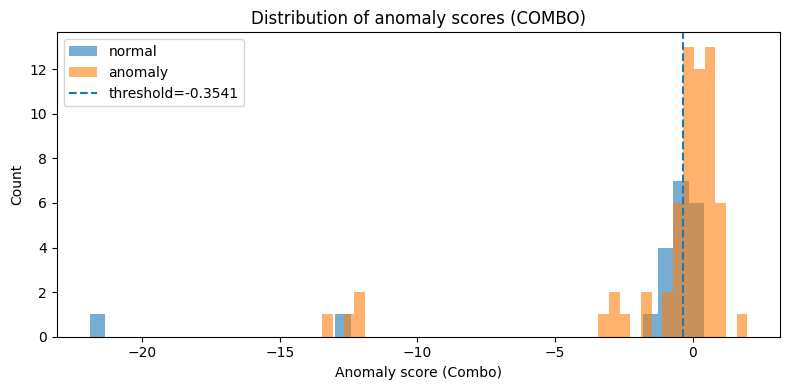

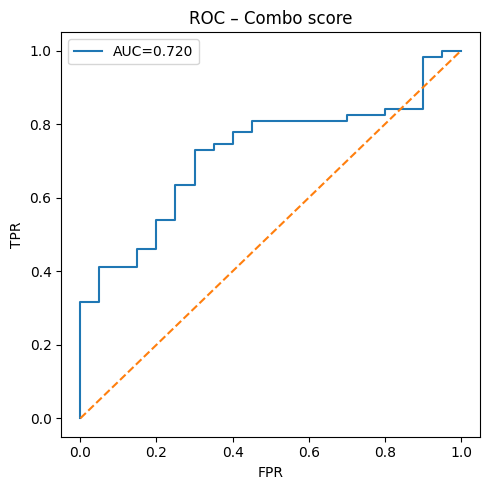

In [163]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

thr = thr_candidates["Youden-J"]  # o quello che scegli

plt.figure(figsize=(8,4))
plt.hist(score_combo[labels_bin==0], bins=40, alpha=0.6, label="normal")
plt.hist(score_combo[labels_bin==1], bins=40, alpha=0.6, label="anomaly")
plt.axvline(thr, linestyle="--", label=f"threshold={thr:.4f}")
plt.xlabel("Anomaly score (Combo)")
plt.ylabel("Count")
plt.title("Distribution of anomaly scores (COMBO)")
plt.legend(); plt.tight_layout(); plt.show()

fpr, tpr, _ = roc_curve(labels_bin, score_combo)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label=f"AUC={roc_auc:.3f}")
plt.plot([0,1],[0,1],"--")
plt.xlabel("FPR"); plt.ylabel("TPR"); plt.title("ROC – Combo score")
plt.legend(); plt.tight_layout(); plt.show()

In [164]:
# Quick patch-size sweep
best_auc_ps, best_ps, best_patch_scores = -1, None, None
for ps in (16, 32, 48):
    pscores = patch_mse_score(X_all, X_recon_all, patch_size=ps, percentile=95)
    auc_ps  = roc_auc_score(labels_bin, pscores)
    print(f"PatchSize={ps} -> AUC PatchMSE: {auc_ps:.4f}")
    if auc_ps > best_auc_ps:
        best_auc_ps, best_ps, best_patch_scores = auc_ps, ps, pscores

print(f"Selected PatchSize={best_ps} (AUC PatchMSE={best_auc_ps:.4f})")
# Rebuild ensemble with best patch scores
patch_z = mad_zscore(best_patch_scores)

PatchSize=16 -> AUC PatchMSE: 0.4706
PatchSize=32 -> AUC PatchMSE: 0.4325
PatchSize=48 -> AUC PatchMSE: 0.7238
Selected PatchSize=48 (AUC PatchMSE=0.7238)


In [165]:
mse_z   = mad_zscore(mse_err)
ssim_z  = mad_zscore(ssim_err)
patch_z = mad_zscore(best_patch_scores)

best_auc = -1
best_weights = None
best_score = None
for wm, ws, wp in [(0.3,0.4,0.3),(0.4,0.3,0.3),(0.35,0.35,0.30)]:
    combo = wm*mse_z + ws*ssim_z + wp*patch_z
    auc_  = roc_auc_score(labels_bin, combo)
    if auc_ > best_auc:
        best_auc, best_weights, best_score = auc_, (wm,ws,wp), combo

print(f"[FINAL] Selected weights: {best_weights} | AUC Combo = {best_auc:.4f}")
score_combo = best_score

# Ricalibra soglie e rifai il confronto metriche sul nuovo score_combo
errors_normal_combo = score_combo[labels_bin == 0]
thr_candidates = {
    "k=3σ"       : threshold_k_sigma(errors_normal_combo, k=3.0),
    "Median+MAD" : threshold_median_mad(errors_normal_combo, k=3.5),
    "Youden-J"   : threshold_youden(score_combo, labels_bin),
    "Recall≥0.85": threshold_for_target_recall(score_combo, labels_bin, 0.85),
}


[FINAL] Selected weights: (0.3, 0.4, 0.3) | AUC Combo = 0.8000


In [166]:
final_cfg = {
    "patch_size": int(best_ps),
    "weights": {"MSE": best_weights[0], "1-SSIM": best_weights[1], "Patch": best_weights[2]},
    "threshold_used": float(thr_candidates["Youden-J"])  # o Recall≥0.85
}
print("FINAL CONFIG:", final_cfg)


FINAL CONFIG: {'patch_size': 48, 'weights': {'MSE': 0.3, '1-SSIM': 0.4, 'Patch': 0.3}, 'threshold_used': -0.5828575790986383}


## Step 4 - Visualization of Results

In [167]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

In [168]:
# Collect images, reconstructions, error maps

# Cache images and labels of test set
X_list, y_list = [], []
for xb, yb in test_ds:
    X_list.append(xb.numpy())
    y_list.append(yb.numpy())

X_test = np.concatenate(X_list, axis=0)
y_test = np.concatenate(y_list, axis=0).astype(int)

# Model reconstructions
X_recon = autoencoder.predict(X_test, verbose=0)

# Error maps or image
err_map = np.mean(np.abs(X_test - X_recon), axis=-1)

# Normalize every heatmap for visualization
err_map_vis = err_map.copy()
for i in range(err_map_vis.shape[0]):
    m = err_map_vis[i]
    m = (m - m.min()) / (m.max() - m.min() + 1e-8)
    err_map_vis[i] = m


In [169]:
# Plotting function
def plot_triplet_grid(X, Xhat, H, indices, title=""):
    n = len(indices)
    plt.figure(figsize=(3*n, 9))
    for j, i in enumerate(indices):
        # Original
        ax = plt.subplot(3, n, j+1)
        plt.imshow(X[i]); plt.axis("off")
        if j == 0: ax.set_ylabel("Original", fontsize=10)
        # Reconstruction
        ax = plt.subplot(3, n, n+j+1)
        plt.imshow(Xhat[i]); plt.axis("off")
        if j == 0: ax.set_ylabel("Reconstructed", fontsize=10)
        # Heatmap overlay
        ax = plt.subplot(3, n, 2*n+j+1)
        plt.imshow(X[i])
        plt.imshow(H[i], cmap="inferno", alpha=0.6)
        plt.axis("off")
        if j == 0: ax.set_ylabel("Error heatmap", fontsize=10)
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

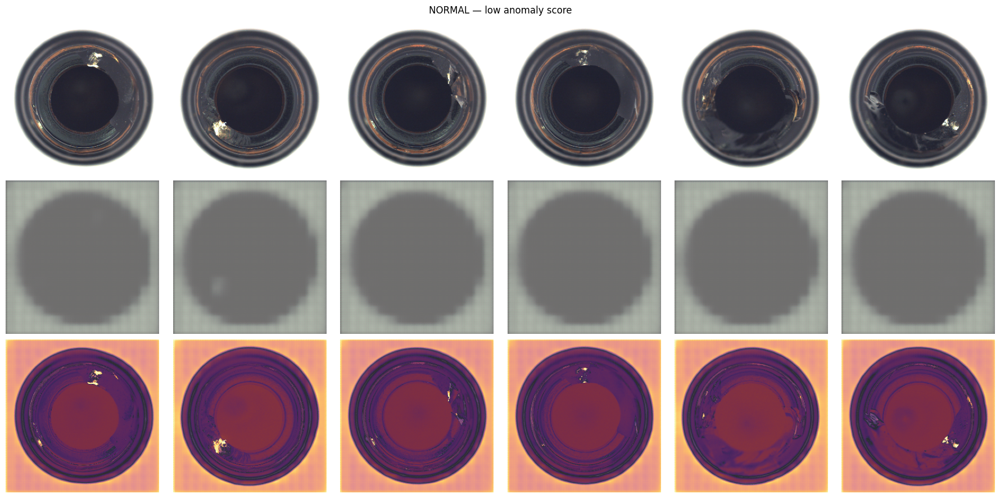

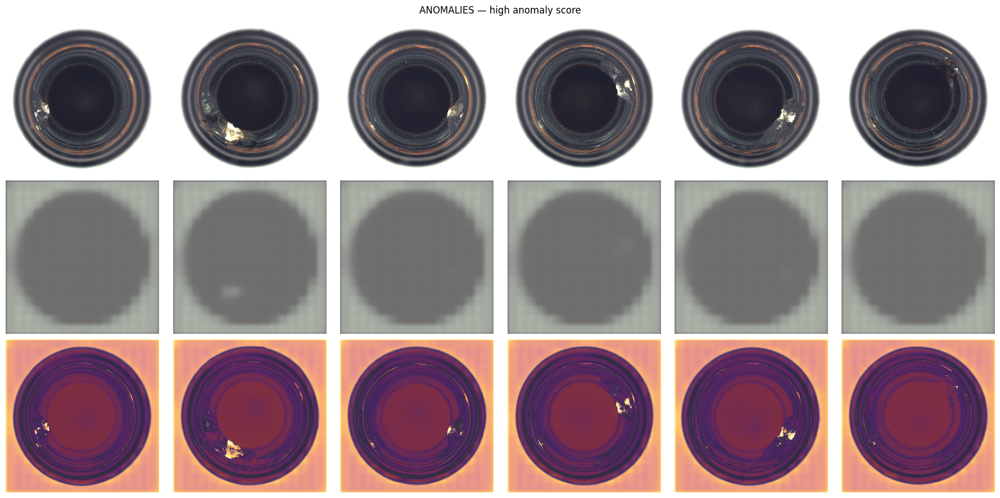

In [170]:
# Let's use score_combo now

idx_norm = np.where(y_test == 0)[0]
idx_anom = np.where(y_test == 1)[0]

# Take best normal (lowest score) and worst anomalies (higher score)
k = 6
top_norm_clean = idx_norm[np.argsort(score_combo[idx_norm])[:k]]
top_anom_bad = idx_anom[np.argsort(score_combo[idx_anom])[-k:]][::-1]

plot_triplet_grid(X_test, X_recon, err_map_vis, top_norm_clean, title="NORMAL — low anomaly score")
plot_triplet_grid(X_test, X_recon, err_map_vis, top_anom_bad,   title="ANOMALIES — high anomaly score")

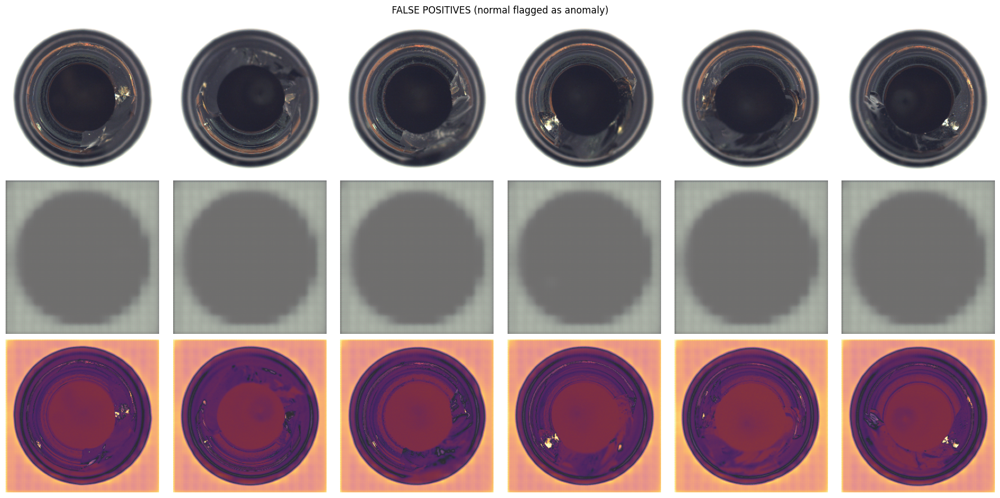

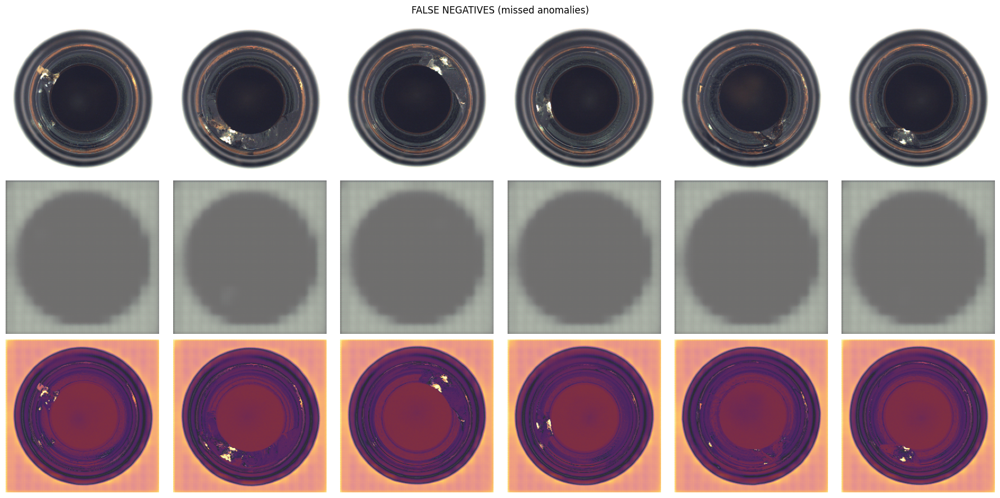

In [171]:
# False positives and false negatives

thr_used = thr_candidates["Youden-J"]
y_pred = (score_combo >= thr_used).astype(int)

fp_idx = np.where((y_test==0) & (y_pred==1))[0]
fn_idx = np.where((y_test==1) & (y_pred==0))[0]

if len(fp_idx):
    show = fp_idx[:min(6, len(fp_idx))]
    plot_triplet_grid(X_test, X_recon, err_map_vis, show, title="FALSE POSITIVES (normal flagged as anomaly)")
if len(fn_idx):
    show = fn_idx[:min(6, len(fn_idx))]
    plot_triplet_grid(X_test, X_recon, err_map_vis, show, title="FALSE NEGATIVES (missed anomalies)")

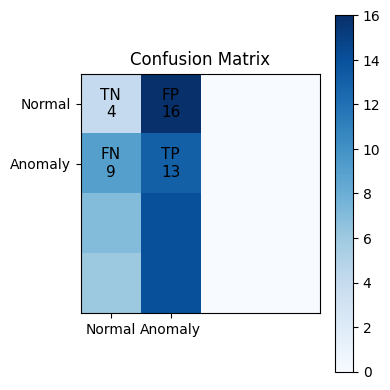

In [172]:
# Confusion Matrix

from sklearn.metrics import confusion_matrix

import matplotlib.pyplot as plt
import numpy as np

cm = confusion_matrix(y_test, y_pred)  # [[TN FP],[FN TP]]
labels_cm = np.array([["TN","FP"],["FN","TP"]])

plt.figure(figsize=(4,4))
plt.imshow(cm, cmap="Blues")
plt.xticks([0,1], ["Normal","Anomaly"])
plt.yticks([0,1], ["Normal","Anomaly"])
plt.title("Confusion Matrix")
for i in range(2):
    for j in range(2):
        plt.text(j, i, f"{labels_cm[i,j]}\n{cm[i,j]}", ha="center", va="center", fontsize=11)
plt.colorbar(); plt.tight_layout(); plt.show()

In [173]:
# Metrics table

import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# binarize
y_true = labels_bin.astype(int)
y_hat  = y_pred.astype(int)

# Compute binary metrics
"""
acc  = accuracy_score(y_true, y_hat)
prec = precision_score(y_true, y_hat, zero_division=0)
rec  = recall_score(y_true, y_hat, zero_division=0)
f1   = f1_score(y_true, y_hat, zero_division=0)

auc  = roc_auc_score(y_true, score_combo)
"""

df_metrics = pd.DataFrame({
    "Threshold": [thr_used],
    "Accuracy" : [accuracy_score(y_true, y_hat)],
    "Precision": [precision_score(y_true, y_hat, zero_division=0)],
    "Recall"   : [recall_score(y_true, y_hat, zero_division=0)],
    "F1-score" : [f1_score(y_true, y_hat, zero_division=0)],
    "ROC-AUC"  : [roc_auc_score(y_true, score_combo)],
    "N normal" : [int((y_true==0).sum())],
    "N anomaly": [int((y_true==1).sum())],
})
df_metrics

,Threshold,Accuracy,Precision,Recall,F1-score,ROC-AUC,N normal,N anomaly
0,-0.582858,0.807229,0.912281,0.825397,0.866667,0.8,20,63
